In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import gensim
tqdm.pandas()
from gensim.models import LdaMulticore
import pyLDAvis.gensim
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings("ignore")
import functions as f


### load dataframes of playlists and artists and clean data

In [4]:
df_playlists = pd.read_csv('data/playlists_final.csv')
df_playlists.drop(columns=['Unnamed: 0'], inplace=True)
df_songs = pd.read_csv('data/scraped_song_ids.csv')
df_songs.drop(columns=['Unnamed: 0'], inplace=True)
df_songs.drop_duplicates(subset=['song_id','artist','track'], inplace=True)
df_songs.artist = df_songs.artist.apply(lambda x: f.remove_artists(x))
df_songs.dropna(subset=['artist'],inplace=True)

### merge both dbs

In [5]:
joined_df = pd.merge(df_playlists,df_songs,left_on='song_id',right_on='song_id',how='left')
joined_df.drop_duplicates(inplace=True)
joined_df.dropna(inplace=True)

### graph distribution of top artists in playlists

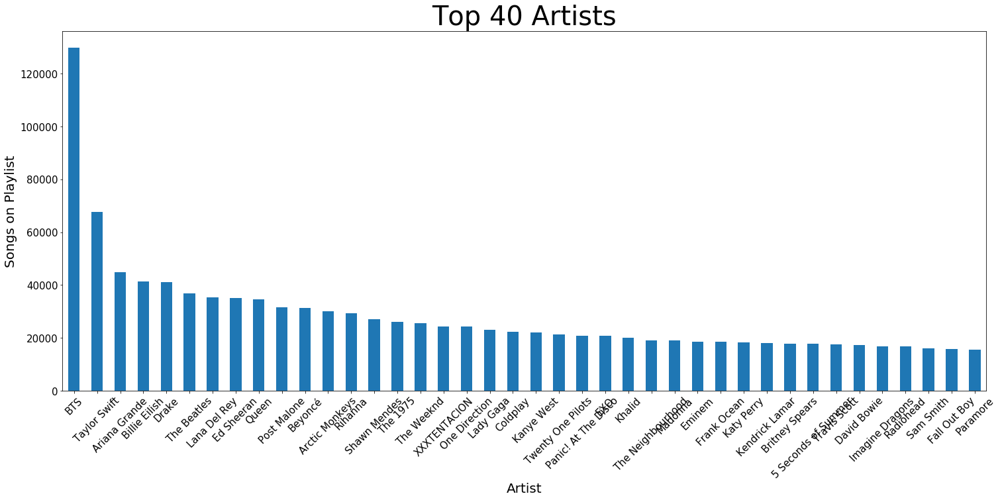

In [6]:
ax = joined_df.artist.value_counts()[0:40].plot(kind='bar', figsize=(25, 10), rot=45, fontsize=15)
ax.set_xlabel("Artist", fontsize=20)
ax.set_ylabel("Songs on Playlist", fontsize=20)
plt.title('Top 40 Artists', fontsize=40)
plt.savefig('hist.png')

### transform the data to datapoints with sequential list of artists in playlist

In [7]:
pivot_table = joined_df.pivot_table(index=['playlist_id'],
                                    values=['artist'],
                                    aggfunc=lambda x: '|'.join(str(v) for v in x))

pivot_table['tokens'] = pivot_table.artist.progress_apply(lambda x: x.split('|'))

100%|██████████| 224107/224107 [00:04<00:00, 52807.54it/s]


### filter playlists that is predominently one artist(outliers)

In [8]:
pivot_table.tokens = pivot_table.tokens.progress_apply(lambda x: f.too_many(x, .75))
pivot_table.dropna(subset=['tokens'], inplace=True)

100%|██████████| 224107/224107 [00:04<00:00, 53511.02it/s]


### fit the word2vec model

In [9]:
from gensim.models import Word2Vec
from gensim.test.utils import common_texts, get_tmpfile

texts = list(pivot_table.tokens)
path = get_tmpfile("word2vec.model")
model = Word2Vec(texts, size=300,min_count = 100, window=10, workers=4, sg=1, negative=7, hs=0)
model.save("no_dups_10window_word2vec.model")

### load the model

In [10]:
from gensim.models import Word2Vec

model = Word2Vec.load("no_dups_10window_word2vec.model")

### create dataframe of all artist vectors (for clustering)

In [11]:
artists = list(model.wv.vocab)

frame_list = []
artists = list(model.wv.vocab)
for artist in artists:
    df = pd.DataFrame({artist:model.wv[artist]})
    frame_list.append(df.transpose())
    
vector_frame = pd.concat(frame_list, sort=False)

In [4]:
vector_frame.reset_index(inplace=True)

In [5]:
vector_frame.rename(columns = {'index': "artist"}, inplace=True)

In [6]:
X = vector_frame.drop(columns=['artist'])
y = vector_frame.artist

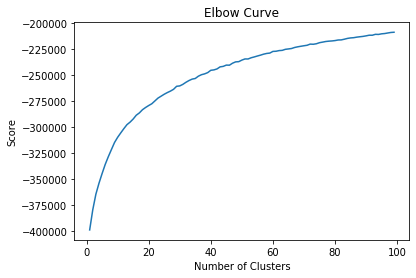

In [16]:
from sklearn.cluster import KMeans
import pylab as pl

Nc = range(1, 100)

kmeans = [KMeans(n_clusters=i) for i in Nc]

kmeans

score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]

score

pl.plot(Nc,score)

pl.xlabel('Number of Clusters')

pl.ylabel('Score')

pl.title('Elbow Curve')

pl.show()

In [8]:
#kmeans clustering for all the vectors
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=45, random_state=0).fit(X)
vector_frame['cluster'] = kmeans.predict(X)

In [14]:
from sklearn.manifold import TSNE

tsne_model = TSNE(perplexity=40, n_components=3, init='pca', n_iter=2500, random_state=23)
new_values = tsne_model.fit_transform(X)
x_val = []
y_val = []
z_val = []
for x in list(new_values):
    x_val.append(x[0])
    y_val.append(x[1])
    z_val.append(x[2])
df_3d = pd.DataFrame({'artist' : list(vector_frame.artist), 'x' : x_val, 'y': y_val, 'z': z_val, 'cluster' : list(vector_frame.cluster)})

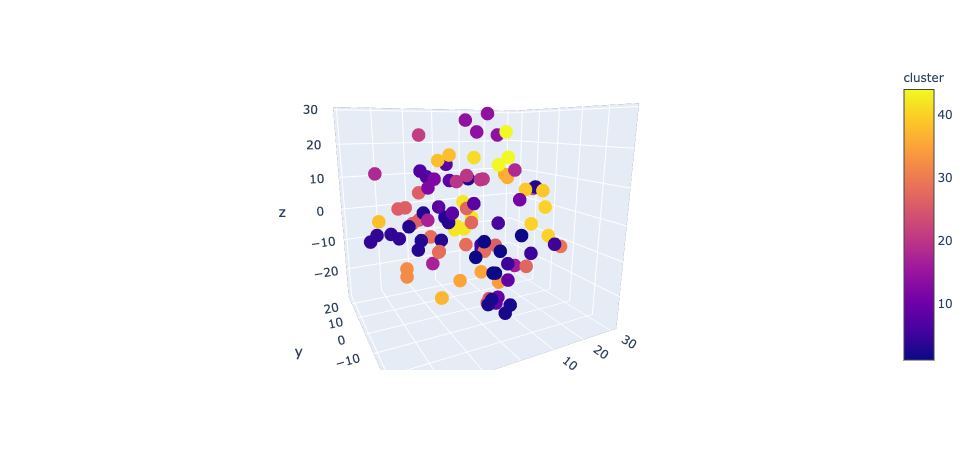

In [15]:
import plotly.express as px
fig = px.scatter_3d(df_3d.sample(100), x='x', y='y',z = 'z', hover_data=['artist','cluster'], color='cluster')
fig.show()

In [9]:
from sklearn.manifold import TSNE

tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
new_values = tsne_model.fit_transform(X)
x_val = []
y_val = []
for x in list(new_values):
    x_val.append(x[0])
    y_val.append(x[1])
df_2d = pd.DataFrame({'artist' : list(vector_frame.artist), 'x' : x_val, 'y': y_val, 'cluster' : list(vector_frame.cluster)})

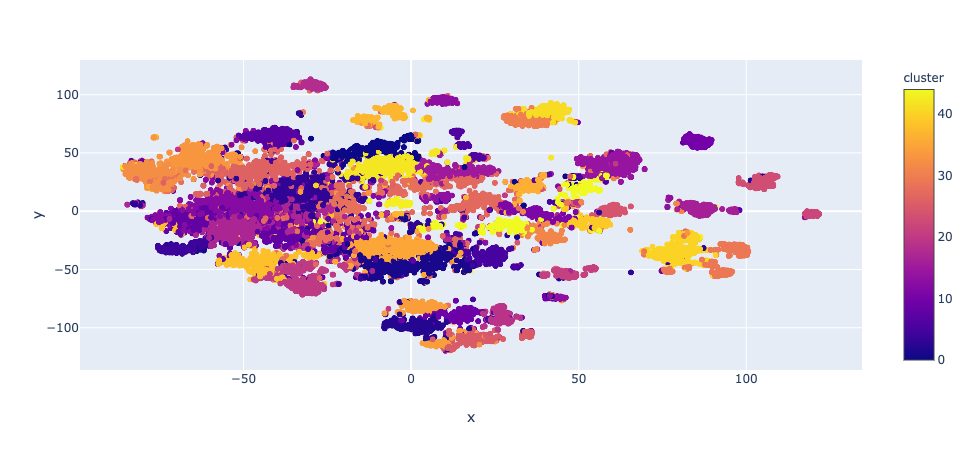

In [11]:
# import plotly.express as px
# fig_2d = px.scatter(df_2d, x='x', y='y', hover_data=['artist','cluster'], color='cluster')
fig_2d.show()

In [14]:
plotly.offline.plot(fig_2d, filename='tsne.html')

'tsne.html'

In [13]:
import plotly

In [19]:
with open('graph_frame.pkl', 'wb') as f:
    pickle.dump(df_3d, f)

In [23]:
with open('artist_list.pkl', 'wb') as f:
    pickle.dump(list(model.wv.vocab), f)

In [27]:
len(list(model.wv.vocab))

30621